In [1]:
import warnings
warnings.filterwarnings("ignore") 

import pysm3 as pysm
import pysm3.units as u
import numpy as np
import healpy as hp 
import pymaster as nmt
import matplotlib.pyplot as plt
import scipy.stats as stat
import matplotlib as mpl
import astropy.io.fits as fits
import scipy.constants as con

mpl.rcParams['font.sans-serif'] = "Helvetica"
plt.style.use('default')

#### Set HEALPix params

In [2]:
nside = 1024
nside_wmap = 512
npix = hp.nside2npix(nside)
lmax = 3 * nside - 1 
lmax_wmap = 3 * nside_wmap - 1
lmax_o = 512
hpx_datapath = '/global/common/software/mp107/shamikg/psm_kit/Healpix_3.82/data'

#### LFI 30 GHz (NPIPE) observations

In [3]:
iqu_npipe30  = hp.read_map('../data/npipe6v20_030_map.fits',  field=None) * 1e6
iqu_npipe30A = hp.read_map('../data/npipe6v20A_030_map.fits', field=None) * 1e6
iqu_npipe30B = hp.read_map('../data/npipe6v20B_030_map.fits', field=None) * 1e6 

pol_npipe30 = np.sqrt(iqu_npipe30[1]**2. + iqu_npipe30[2]**2.)
pol_npipe30A = np.sqrt(iqu_npipe30A[1]**2. + iqu_npipe30A[2]**2.)
pol_npipe30B = np.sqrt(iqu_npipe30B[1]**2. + iqu_npipe30B[2]**2.)

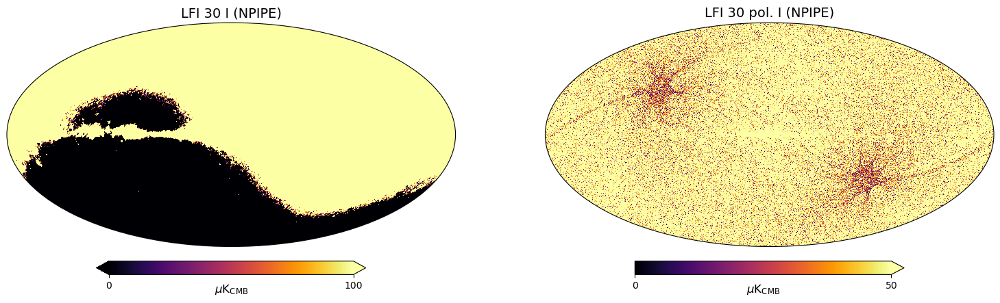

In [5]:
hp.projview(m=iqu_npipe30[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 I (NPIPE)', graticule_color=None)
hp.projview(m=pol_npipe30, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 pol. I (NPIPE)', graticule_color=None)

False


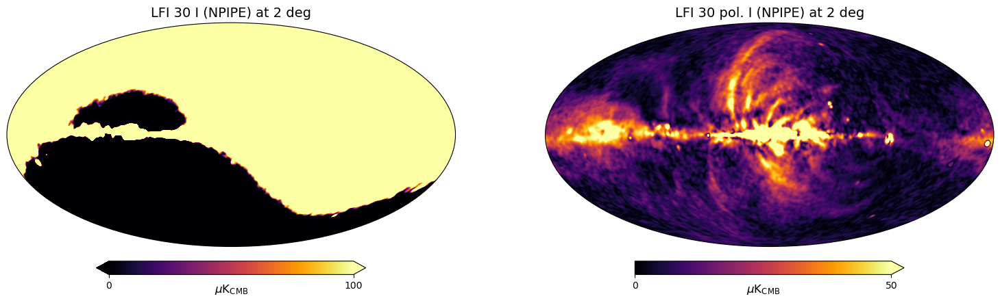

In [4]:
alms = hp.map2alm(iqu_npipe30, lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

print(np.any(np.isnan(Bl_com[:,1]/Bl_30[:,1])))

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_npipe30_smth = hp.alm2map(alms, nside)
pol_npipe30_smth = np.sqrt(iqu_npipe30_smth[1]**2. + iqu_npipe30_smth[2]**2.)

E_npipe30_smth = hp.alm2map(alms[1], nside)
B_npipe30_smth = hp.alm2map(alms[2], nside)

hp.projview(m=iqu_npipe30_smth[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 I (NPIPE) at 2 deg', graticule_color=None)
hp.projview(m=pol_npipe30_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 pol. I (NPIPE) at 2 deg', graticule_color=None)

#### PR3 SMICA CMB map

In [5]:
smica_PR3 = hp.read_map('../data/COM_CMB_IQU-smica_2048_R3.00_full.fits', field=None) * 1e6

alms = hp.map2alm(smica_PR3[0:3], lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

print(np.any(np.isnan(Bl_com[:,1]/Bl_30[:,1])))

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_smica_smth = hp.alm2map(alms, nside)
pol_smica_smth = np.sqrt(iqu_smica_smth[1]**2. + iqu_smica_smth[2]**2.)

E_smica_smth = hp.alm2map(alms[1], nside)
B_smica_smth = hp.alm2map(alms[2], nside)

False


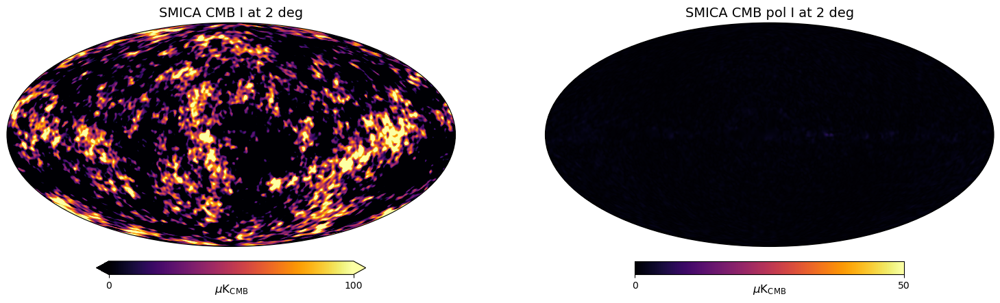

In [8]:
hp.projview(m=iqu_smica_smth[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='SMICA CMB I at 2 deg', graticule_color=None)
hp.projview(m=pol_smica_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='SMICA CMB pol I at 2 deg', graticule_color=None)

#### LFI 30 GHz PR3 map for visual comparison 

False


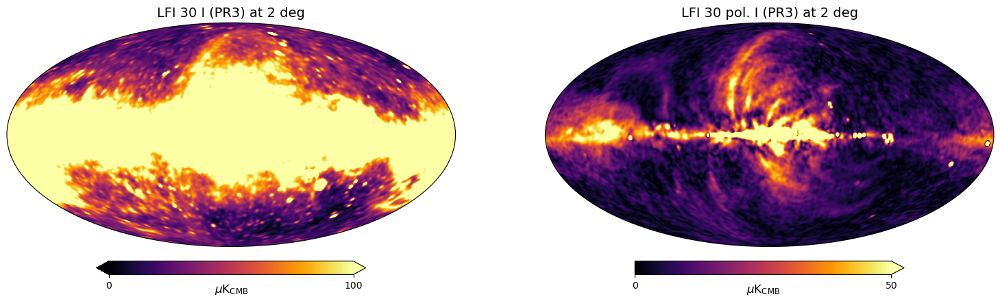

In [9]:
lfi30_PR3 = hp.read_map('../data/LFI_SkyMap_030-BPassCorrected-field-IQU_1024_R3.00_full.fits', field=None) * 1e6

alms = hp.map2alm(lfi30_PR3, lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

print(np.any(np.isnan(Bl_com[:,1]/Bl_30[:,1])))

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_pr330_smth = hp.alm2map(alms, nside)
pol_pr330_smth = np.sqrt(iqu_pr330_smth[1]**2. + iqu_pr330_smth[2]**2.)

E_pr330_smth = hp.alm2map(alms[1], nside)
B_pr330_smth = hp.alm2map(alms[2], nside)

hp.projview(m=iqu_pr330_smth[0] - iqu_smica_smth[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 I (PR3) at 2 deg', graticule_color=None)
hp.projview(m=pol_pr330_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 pol. I (PR3) at 2 deg', graticule_color=None)

#### NPIPE A/B splits

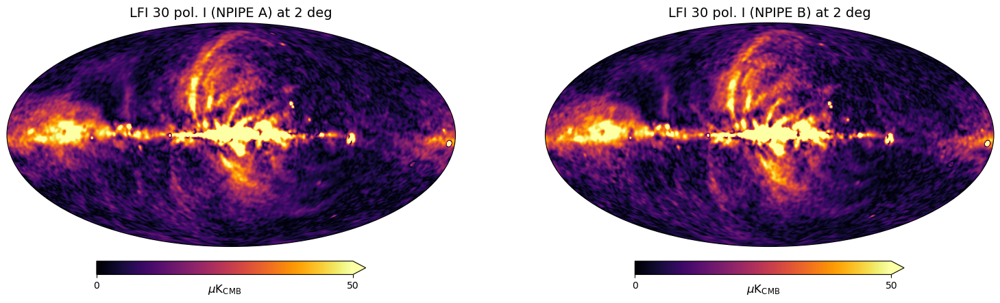

In [10]:
alms = hp.map2alm(iqu_npipe30A, lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_npipe30A_smth = hp.alm2map(alms, nside)
pol_npipe30A_smth = np.sqrt(iqu_npipe30A_smth[1]**2. + iqu_npipe30A_smth[2]**2.)

alms = hp.map2alm(iqu_npipe30B, lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_npipe30B_smth = hp.alm2map(alms, nside)
pol_npipe30B_smth = np.sqrt(iqu_npipe30B_smth[1]**2. + iqu_npipe30B_smth[2]**2.)

hp.projview(m=pol_npipe30A_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 pol. I (NPIPE A) at 2 deg', graticule_color=None)
hp.projview(m=pol_npipe30B_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 pol. I (NPIPE B) at 2 deg', graticule_color=None)

#### WMAP K band (9yr) observation

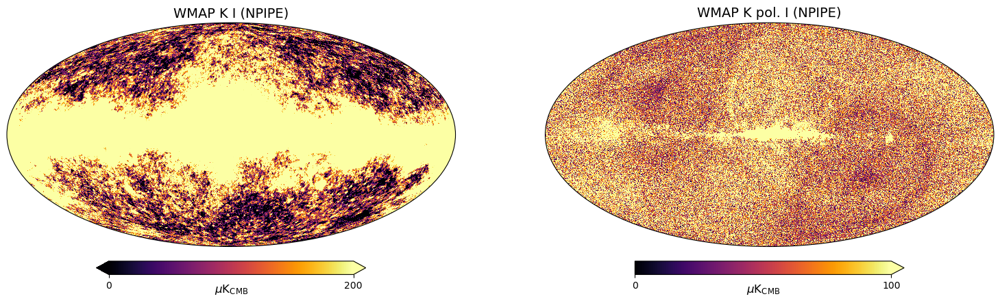

In [6]:
iqu_wmapk = hp.read_map('../data/wmap_band_iqumap_r9_9yr_K_v5.fits', field=None) * 1.e3
pol_wmapk = np.sqrt(iqu_wmapk[1]**2. + iqu_wmapk[2]**2.)

hp.projview(m=iqu_wmapk[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=200, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K I (NPIPE)', graticule_color=None)
hp.projview(m=pol_wmapk, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K pol. I (NPIPE)', graticule_color=None)

False


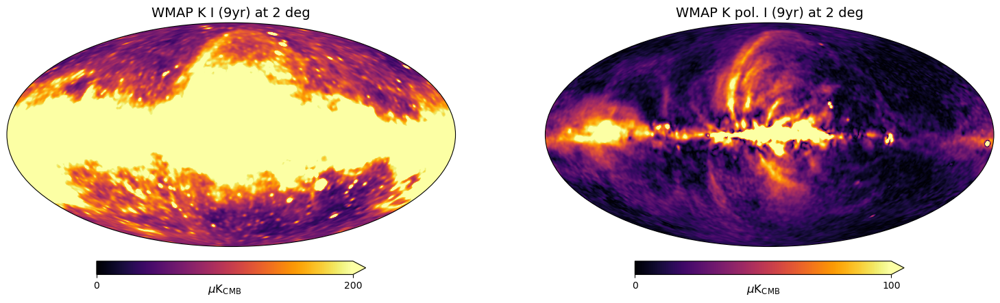

In [60]:
alms = hp.map2alm(iqu_wmapk[:3], lmax=lmax_wmap, use_weights=True, datapath=hpx_datapath)
Bl_k = hp.gauss_beam(np.deg2rad(52.8/60.), lmax=lmax_wmap, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax_wmap, pol=True)

print(np.any(np.isnan(Bl_com[:,1]/Bl_k[:,1])))

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_k[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_k[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_k[:,2])

iqu_wmapk_smth = hp.alm2map(alms, nside_wmap)
pol_wmapk_smth = np.sqrt(iqu_wmapk_smth[1]**2. + iqu_wmapk_smth[2]**2.)

hp.projview(m=iqu_wmapk_smth[0] - hp.ud_grade(iqu_smica_smth[0], nside_wmap), unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=200, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K I (9yr) at 2 deg', graticule_color=None)
hp.projview(m=pol_wmapk_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K pol. I (9yr) at 2 deg', graticule_color=None)

#### CMB-S4 alternative 1 ultra-deep patch (SAT-TMA common footprint)

In [7]:
rot = hp.Rotator(coord='CG')
mask_alt1 = hp.read_map('../data/mask_fg_alt1.fits')
mask_alt1 = rot.rotate_map_alms(mask_alt1)
mask_alt1[mask_alt1 <= 0.9] = 0.
mask_alt1[mask_alt1 > 0.9] = 1.

mask_1024 = hp.ud_grade(mask_alt1, nside)
mask_512  = hp.ud_grade(mask_alt1, nside_wmap)

mask_1024[mask_1024 <= 0.9] = 0.
mask_1024[mask_1024 > 0.9] = 1.

mask_512[mask_512 <= 0.9] = 0.
mask_512[mask_512 > 0.9] = 1.

maskapo_1024 = nmt.mask_apodization(mask_1024, 6., apotype='C2')
maskapo_512  = nmt.mask_apodization(mask_512,  6., apotype='C2')

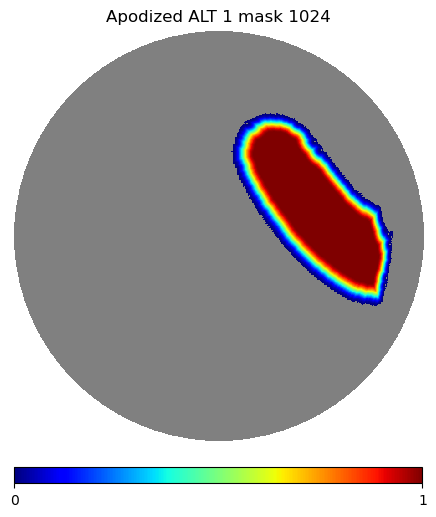

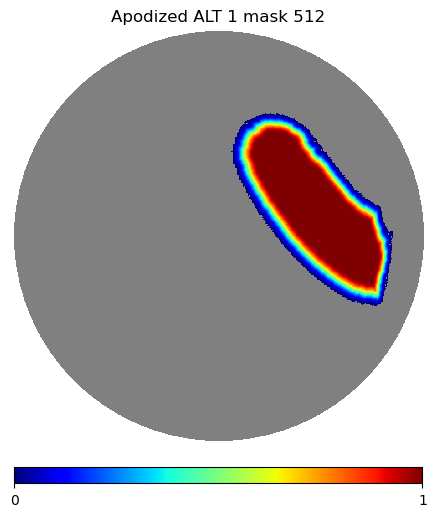

In [9]:
hp.orthview(np.ma.masked_array(maskapo_1024, mask=1-mask_1024), xsize=900, min=0., max=1, cmap='jet', title='Apodized ALT 1 mask 1024', rot=(0, -90, 0), half_sky=True)
hp.orthview(np.ma.masked_array(maskapo_512, mask=1-mask_512), xsize=900, min=0., max=1, cmap='jet', title='Apodized ALT 1 mask 512', rot=(0, -90, 0), half_sky=True)

#### Planck PR2 polarized polint source mask

In [8]:
ps_mask, header = hp.read_map('../resources/LFI_Mask_PointSrc_2048_R2.00.fits',field=None,h=True, hdu=4)
# print(header)

[('XTENSION', 'BINTABLE'), ('BITPIX', 8), ('NAXIS', 2), ('NAXIS1', 4), ('NAXIS2', 50331648), ('PCOUNT', 0), ('GCOUNT', 1), ('TFIELDS', 1), ('COMMENT', ''), ('COMMENT', ' *** End of mandatory fields ***'), ('COMMENT', ''), ('EXTNAME', 'LFI_030_PolPsMask'), ('EXTVER', 1), ('DATE', '2014-11-27'), ('COMMENT', ''), ('COMMENT', ' *** Column names ***'), ('COMMENT', ''), ('TTYPE1', 'POLPS_MASK_030'), ('COMMENT', ''), ('COMMENT', ' *** Column formats ***'), ('COMMENT', ''), ('TFORM1', 'E'), ('COMMENT', ''), ('COMMENT', '*** Column units ***'), ('COMMENT', ''), ('TUNIT1', 'Flag'), ('COMMENT', ''), ('COMMENT', '*** Planck params ***'), ('COMMENT', ''), ('PIXTYPE', 'HEALPIX'), ('ORDERING', 'NESTED'), ('COORDSYS', 'GALACTIC'), ('NSIDE', 2048), ('FIRSTPIX', 0), ('LASTPIX', 50331647), ('INDXSCHM', 'IMPLICIT'), ('BAD_DATA', -1.6375e+30), ('PROCVER', 'DX11_delta'), ('FILENAME', 'LFI_Mask_PointSrc_2048_R2.00.fits'), ('COMMENT', ''), ('COMMENT', '    Original Inputs'), ('COMMENT', '---------------------

In [9]:
ps_mask_1024 = hp.ud_grade(ps_mask, nside)
ps_mask_1024[ps_mask_1024 >= 0.9] = 1.
ps_mask_1024[ps_mask_1024 < 0.9] = 0.

ps_mask_512 = hp.ud_grade(ps_mask, nside_wmap)
ps_mask_512[ps_mask_512 >= 0.9] = 1.
ps_mask_512[ps_mask_512 < 0.9] = 0.

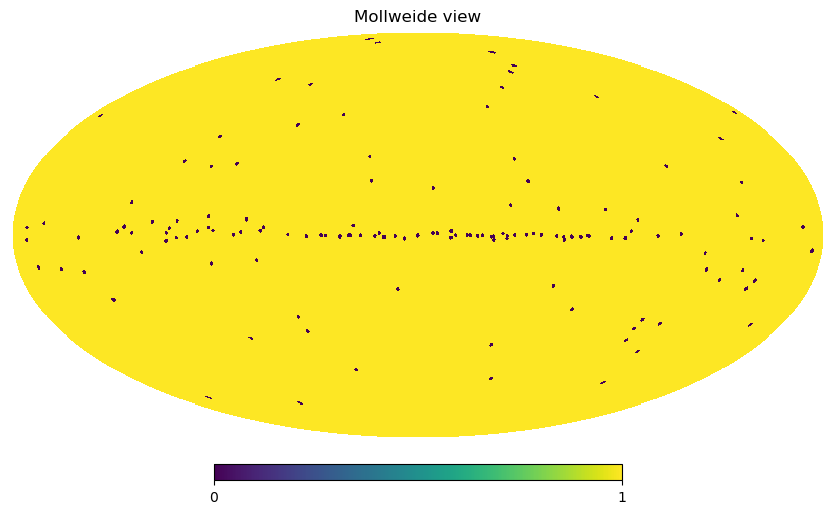

In [23]:
hp.mollview(ps_mask_1024)

#### Apodized point source mask

In [10]:
ps_mask_apo1024 = nmt.mask_apodization(ps_mask_1024, 6., apotype='C2')
ps_mask_apo512 = nmt.mask_apodization(ps_mask_512, 6., apotype='C2')

#### CMB-S4 mask x PS mask apodized

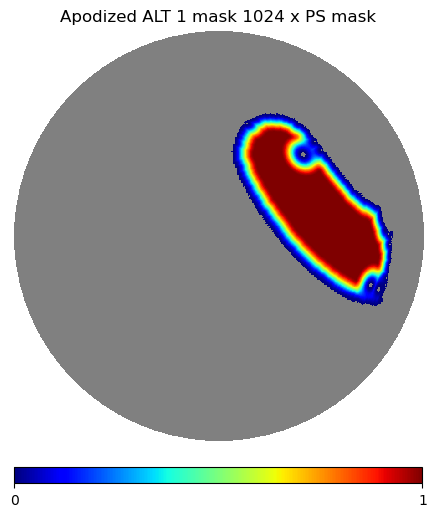

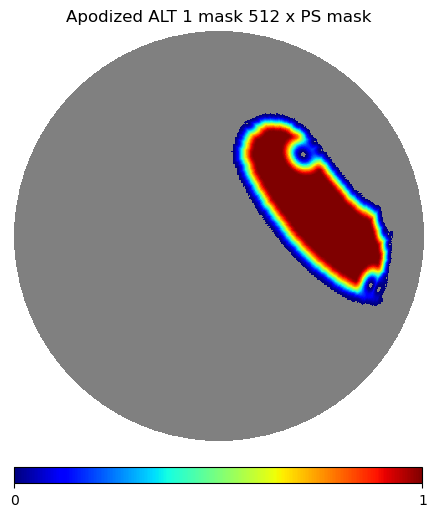

In [11]:
hp.orthview(np.ma.masked_array(maskapo_1024 * ps_mask_apo1024, mask=1-mask_1024*ps_mask_1024), xsize=900, min=0., max=1, cmap='jet', title='Apodized ALT 1 mask 1024 x PS mask', rot=(0, -90, 0), half_sky=True)
hp.orthview(np.ma.masked_array(maskapo_512 * ps_mask_apo512 , mask=1-mask_512*ps_mask_512), xsize=900, min=0., max=1, cmap='jet', title='Apodized ALT 1 mask 512 x PS mask', rot=(0, -90, 0), half_sky=True)

#### Theory and measured CMB power spectra

In [12]:
# Read theory Cls computed with CLASS for debiasing 
Dl_lensed = np.loadtxt('../resources/class_cl_lensed.dat')
factor = Dl_lensed[:,0] * (Dl_lensed[:,0] + 1) / 2. / np.pi
ellmax = 2048

T_CMB = 2.7255 * 1.e6 # uK

Bl = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=ellmax, pol=True)

TT = np.array(Dl_lensed[:ellmax-1,1] * T_CMB**2. / factor[:ellmax-1]) 
EE = np.array(Dl_lensed[:ellmax-1,2] * T_CMB**2. / factor[:ellmax-1])
TE = np.array(Dl_lensed[:ellmax-1,3] * T_CMB**2. / factor[:ellmax-1])
BB = np.array(Dl_lensed[:ellmax-1,4] * T_CMB**2. / factor[:ellmax-1])

TT = np.insert(TT, [0,1], [0.,0.])
EE = np.insert(EE, [0,1], [0.,0.])
TE = np.insert(TE, [0,1], [0.,0.])
BB = np.insert(BB, [0,1], [0.,0.])

EE = EE[:ellmax+1] * Bl[:ellmax+1,1]**2.
BB = BB[:ellmax+1] * Bl[:ellmax+1,2]**2.

In [13]:
# Read Planck EE power spectrum for debiasing EE observed power
ls, plkEE, perrplkEE, merrplkEE  = np.loadtxt('../resources/COM_PowerSpect_CMB-EE-full_R3.01.txt', unpack=True)
calPLK = 0.1000442E+01

plkEE = np.concatenate([np.array([0., 0.]), plkEE])

#### Binning and power spectra wrapper functions (anafast/NaMaster)

In [14]:
def setup_bins(nside, lmax_o, bsz_0=30, loglims=[[1.35]]):
# 
# Set scaling as [scaling, lmax_scale] for each choice. 
# If same scaling wanted for entire ell range set only scaling.
# Thus loglims is a tuple if signgle or double element lists: 
# [[sca_1, lmax_sca1],[sca_2, lmax_sca2],...] 
#
    i = 0
    bin_sz = []
    ell_min = [] 
    leff = []
    while True:
        # print(i)
        if i == 0:
            ell_min_d = 2
            ell_max_d = bsz_0
        else :
            ell_min_d = ell_max_d + 1
            
            for i in range(len(loglims)):

                if len(loglims[i]) == 1:
                    ell_max_d = np.int(np.maximum(ell_min_d + bsz_0, np.ceil(loglims[i][0] * ell_min_d)))
                    break
                elif len(loglims[i]) == 2:
                    if ell_min_d < loglims[i][1]:
                        ell_max_d = np.int(np.maximum(ell_min_d + bsz_0, np.ceil(loglims[i][0] * ell_min_d)))
                        break

        if ell_max_d > lmax_o:
            # print(ell_max_d)
            break
        else:
            ell_min.append(ell_min_d)
            bin_sz.append(np.int(ell_max_d - ell_min_d + 1))
            leff.append((ell_min_d + ell_max_d) / 2.)
            # print(ell_min[i], ell_max_d, LL[i])
            i = i + 1

    bin_sz = np.array(bin_sz)
    ell_min = np.array(ell_min)
    leff = np.array(leff) 
    
    ells = np.arange(3 * nside, dtype='int32') 
    wgts = np.zeros(ells.shape)
    bpws = -1 + np.zeros_like(ells)

    for j in range(0, len(bin_sz)):
        dum_i = ell_min[j]
        dum_f = ell_min[j] + bin_sz[j]
        # print(dum_i, dum_f)
        bpws[dum_i:dum_f] = j
        wgts[dum_i:dum_f] = 1. / bin_sz[j]  

    b = nmt.NmtBin(nside=nside, bpws=bpws, ells=ells, weights=wgts, lmax=lmax_o, is_Dell=True)
    leff = b.get_effective_ells()

    return b, leff, bin_sz, ell_min

b, leff, bin_sz, ell_min = setup_bins(nside, lmax_o)
b_wmap, leff_wmap, bin_sz_wmap, ell_min_wmap = setup_bins(nside_wmap, lmax_o)

def binner(Dell_in, is_Cell = False, fixed_bins=False):
    ell = np.arange(lmax_o+1)
    Dell_factor = ell * (ell + 1.) / 2. / np.pi

    Dell = np.copy(Dell_in[0:lmax_o+1])

    if is_Cell :
        Dell = Dell_factor[0:lmax_o+1] * Dell    

    Dell_binned = []

    if fixed_bins :
        bsz= bin_sz * np.ones(len(leff), dtype=np.int32)
    else :
        bsz = bin_sz

    # print(bsz)
    lmin_i = 2
    lmax_i = lmin_i + bsz[0]

    for i in range(0,len(leff)):
        # print(lmin_i, lmax_i)                                               
        dummy = np.sum(Dell[lmin_i:lmax_i])  / (lmax_i - lmin_i)
        
        Dell_binned.append(dummy)  

        if i < len(leff)-1:
            lmin_i = lmax_i
            lmax_i = lmin_i + bsz[i+1]    
        
    del dummy, Dell
    return np.array(Dell_binned)

In [19]:
def compute_Dl(iqu_1, iqu_2=None, debias=False):
    nside1 = hp.npix2nside(len(iqu_1[0]))
    if nside1 == 1024:
        mask1 = maskapo_1024
        ps_mask1 = ps_mask_apo1024
    elif nside1 == 512:
        mask1 = maskapo_512
        ps_mask1 = ps_mask_apo512
    
    lmax1 = 3*nside1 - 1

    alms_1 = hp.map2alm(iqu_1 * ps_mask1, lmax=lmax1, use_weights=True, datapath=hpx_datapath)
    E_1 = hp.alm2map(alms_1[1],nside1) * np.round(ps_mask1)
    B_1 = hp.alm2map(alms_1[2],nside1) * np.round(ps_mask1)
    fsky1 = np.sum((mask1 * ps_mask1)**2.)**2. / np.sum((mask1 * ps_mask1)**4.) * hp.nside2pixarea(nside1) / 4. / np.pi
    # fsky1 = np.sum((mask1 * ps_mask1)**2.) / len(iqu_1[0])

    if isinstance(iqu_2, (np.ndarray, list, tuple)):
        nside2 = hp.npix2nside(len(iqu_2[0]))
        if nside2 == 1024:
            mask2 = maskapo_1024
            ps_mask2 = ps_mask_apo1024
        elif nside2 == 512:
            mask2 = maskapo_512
            ps_mask2 = ps_mask_apo512
            
        lmax2 = 3*nside2 - 1

        alms_2 = hp.map2alm(iqu_2 * ps_mask2, lmax=lmax2, use_weights=True, datapath=hpx_datapath)
        E_2 = hp.alm2map(alms_2[1],nside2) * np.round(ps_mask2)
        B_2 = hp.alm2map(alms_2[2],nside2) * np.round(ps_mask2)
        fsky2 = np.sum((mask2 * ps_mask2)**2.)**2. / np.sum((mask2 * ps_mask2)**4.) * hp.nside2pixarea(nside2) / 4. / np.pi
        # fsky2 = np.sum((mask2 * ps_mask2)**2.) / len(iqu_2[0])
    else:
        mask2 = mask1
        E_2 = E_1 
        B_2 = B_1
        fsky2 = fsky1

    # print(nside1, lmax1, fsky1, fsky2)
    
    ellmax = 1024
    ells = np.arange(0, ellmax+1)
    Dell_factor = ells * (ells + 1.) / 2. / np.pi

    if debias:
        DlEE_1x2 = Dell_factor * ((hp.anafast(E_1 * mask1, map2=E_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) - EE[0:ellmax+1]) 
        DlBB_1x2 = Dell_factor * ((hp.anafast(B_1 * mask1, map2=B_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) - BB[0:ellmax+1]) 
    else:
        DlEE_1x2 = Dell_factor * (hp.anafast(E_1 * mask1, map2=E_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) 
        DlBB_1x2 = Dell_factor * (hp.anafast(B_1 * mask1, map2=B_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) 

        
    return DlEE_1x2, DlBB_1x2

In [21]:
def map2coupCl_nmt(map_in, mask_in, map_in2=None, beam2=None, lmax_sht=-1, beam=None, masked_on_input=False, bins=None, return_wsp=False):
    field = nmt.NmtField(mask_in, [map_in], beam=beam, lmax_sht=lmax_sht, masked_on_input=masked_on_input)

    if return_wsp:
        wsp = nmt.NmtWorkspace()

    if isinstance(map_in2, (list, tuple, np.ndarray)):
        field2 = nmt.NmtField(mask_in, [map_in2], beam=beam2, lmax_sht=lmax_sht, masked_on_input=masked_on_input)

        coup_Cl = nmt.compute_coupled_cell(field, field2)

        if return_wsp: wsp.compute_coupling_matrix(field, field2, bins)
    else:
        coup_Cl = nmt.compute_coupled_cell(field, field)
        if return_wsp: wsp.compute_coupling_matrix(field, field, bins)

    if return_wsp:

        return coup_Cl, wsp 
    else:
        return coup_Cl

def map2Cl_nmt(map_in, mask_in, bins, map_in2=None, lmax_sht=-1, beam=None, beam2=None, masked_on_input=False, return_wsp=False, reuse_wsp=None, noise_Cl=None, bias_Cl=None):
    if isinstance(reuse_wsp, type(nmt.NmtWorkspace())):
        coup_Cl = map2coupCl_nmt(map_in, mask_in, map_in2=map_in2, beam2=beam2, lmax_sht=lmax_sht, beam=beam, masked_on_input=masked_on_input, bins=bins)
        Cls = reuse_wsp.decouple_cell(coup_Cl, cl_bias=bias_Cl, cl_noise=noise_Cl)

        return Cls
    else:
        coup_Cl, wsp = map2coupCl_nmt(map_in, mask_in, map_in2=map_in2, beam2=beam2, lmax_sht=lmax_sht, beam=beam, masked_on_input=masked_on_input, bins=bins, return_wsp=True)

        Cls = wsp.decouple_cell(coup_Cl, cl_bias=bias_Cl, cl_noise=noise_Cl)

        if return_wsp:
            return Cls, wsp 
        else:
            return Cls

In [28]:
def compute_nmtDl(iqu_1, iqu_2=None, debias=False):
    nside1 = hp.npix2nside(len(iqu_1[0]))  
    
    if nside1 == 1024:
        ps_mask1 = ps_mask_apo1024
        mask1 = maskapo_1024
        bins = b
    elif nside1 == 512:
        ps_mask1 = ps_mask_apo512
        mask1 = maskapo_512
        bins = b_wmap
        
    lmax1 = 3*nside1 - 1

    alms_1 = hp.map2alm(iqu_1 * ps_mask1, lmax=lmax1, use_weights=True, datapath=hpx_datapath)
    E_1 = hp.alm2map(alms_1[1],nside1) * np.ceil(ps_mask1)
    B_1 = hp.alm2map(alms_1[2],nside1) * np.ceil(ps_mask1)
    

    if isinstance(iqu_2, (np.ndarray, list, tuple)):  
        nside2 = nside1
        ps_mask2 = ps_mask1
        mask2 = mask1
        lmax2 = 3*nside2 - 1

        alms_2 = hp.map2alm(iqu_2 * ps_mask2, lmax=lmax2, use_weights=True, datapath=hpx_datapath)
        E_2 = hp.alm2map(alms_2[1],nside2) * np.ceil(ps_mask2)
        B_2 = hp.alm2map(alms_2[2],nside2) * np.ceil(ps_mask2)
        
    else:
        mask2 = mask1
        E_2 = E_1 
        B_2 = B_1

    # print(nside1, lmax1, fsky1, fsky2)
    
    lmax_sht = min(1996, lmax1)

    # if debias:
    #     DlEE_1x2 = map2Cl_nmt(E_1 * mask1, mask1, bins, map_in2=E_2 * mask2, lmax_sht=lmax_sht, masked_on_input=True, bias_Cl=np.reshape(plkEE[:lmax_sht+1], (1,lmax_sht+1)))[0] 
    #     DlBB_1x2 = map2Cl_nmt(B_1 * mask1, mask1, bins, map_in2=B_2 * mask2, lmax_sht=lmax_sht, masked_on_input=True, bias_Cl=np.reshape(BB[:lmax_sht+1], (1,lmax_sht+1)))[0] 
    # else:
    DlEE_1x2 = map2Cl_nmt(E_1 * mask1, mask1, bins, map_in2=E_2 * mask2, lmax_sht=lmax_sht, masked_on_input=True)[0] 
    DlBB_1x2 = map2Cl_nmt(B_1 * mask1, mask1, bins, map_in2=B_2 * mask2, lmax_sht=lmax_sht, masked_on_input=True)[0] 
        
    return DlEE_1x2, DlBB_1x2

#### Compute power spectra for LFI/WMAP data

In [23]:
DlEE_npipe, DlBB_npipe = compute_Dl(iqu_npipe30, debias=True) 
DlEE_npxk,   DlBB_npxk = compute_Dl(iqu_npipe30, iqu_2=iqu_wmapk[:3], debias=True)
DlEE_AxB,     DlBB_AxB = compute_Dl(iqu_npipe30A, iqu_2=iqu_npipe30B, debias=True)
DlEE_hd,       DlBB_hd = compute_Dl(0.5*(iqu_npipe30A - iqu_npipe30B))

In [29]:
alms = hp.map2alm(iqu_npipe30, lmax=lmax, use_weights=True, datapath=hpx_datapath)
iqu_npipe30_at512 = hp.alm2map(alms, nside_wmap)

DlEEnmt_npipe30, DlBBnmt_npipe30 = compute_nmtDl(iqu_npipe30, debias=True)
DlEEnmt_npxk,       DlBBnmt_npxk = compute_nmtDl(iqu_npipe30_at512, iqu_2=iqu_wmapk[:3], debias=True) 
DlEEnmt_AxB,         DlBBnmt_AxB = compute_nmtDl(iqu_npipe30A, iqu_2=iqu_npipe30B, debias=True)
DlEEnmt_hd,           DlBBnmt_hd = compute_nmtDl(0.5*(iqu_npipe30A - iqu_npipe30B))

#### Synchrotron model 4 (read and compute spectra)

In [39]:
iqu_s4_30 = hp.read_map('../data/sync4_v3.4b7_LFI030-bpi_' + str(nside) + '.fits', field=None, dtype=np.float64)
iqu_s4_k  = hp.read_map('../data/sync4_v3.4b7_WMAPK-bpi_' + str(nside_wmap) + '.fits', field=None, dtype=np.float64)

pol_s4_30 = np.sqrt(iqu_s4_30[1]**2. + iqu_s4_30[2]**2.)
pol_s4_k  = np.sqrt(iqu_s4_k[1]**2.  + iqu_s4_k[2]**2.)

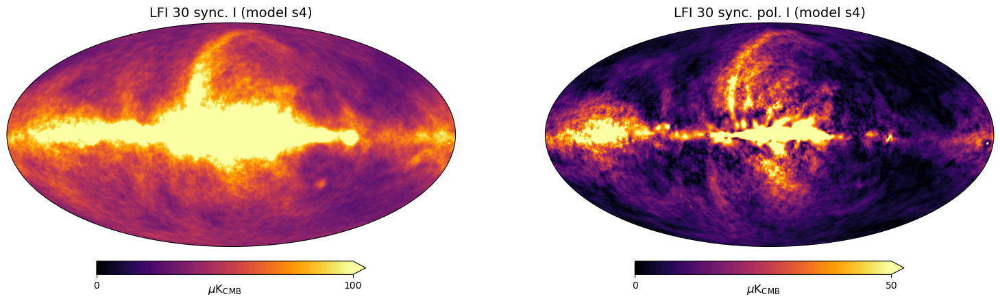

In [40]:
hp.projview(m=iqu_s4_30[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 sync. I (model s4)', graticule_color=None)
hp.projview(m=pol_s4_30, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 sync. pol. I (model s4)', graticule_color=None)

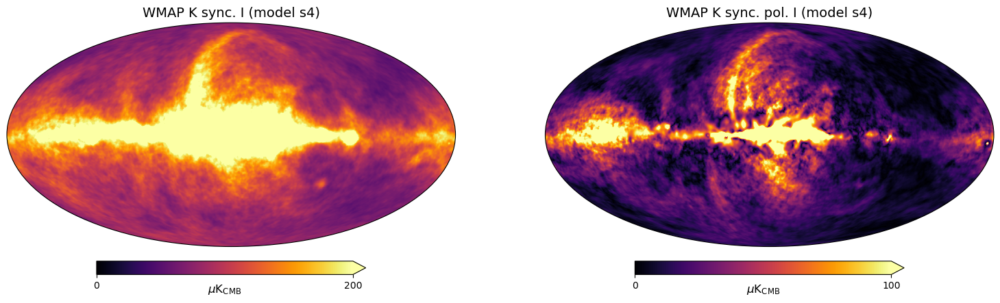

In [41]:
hp.projview(m=iqu_s4_k[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=200, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K sync. I (model s4)', graticule_color=None)
hp.projview(m=pol_s4_k, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K sync. pol. I (model s4)', graticule_color=None)

In [42]:
DlEE_s4_30, DlBB_s4_30 = compute_Dl(iqu_s4_30)
DlEE_s4_x,  DlBB_s4_x  = compute_Dl(iqu_s4_30, iqu_2=iqu_s4_k)

In [43]:
alms = hp.map2alm(iqu_s4_30, lmax=lmax, use_weights=True, datapath=hpx_datapath)
iqu_s4_30_at512 = hp.alm2map(alms, nside_wmap)

In [44]:
DlEEnmt_s4_30, DlBBnmt_s4_30 = compute_nmtDl(iqu_s4_30)
DlEEnmt_s4_x,  DlBBnmt_s4_x  = compute_nmtDl(iqu_s4_30_at512, iqu_2=iqu_s4_k)

#### Synchrotron model 5 (read and compute spectra)

In [45]:
iqu_s5_30 = hp.read_map('../data/sync5_v3.4b7_LFI030-bpi_' + str(nside) + '.fits', field=None, dtype=np.float64)
iqu_s5_k  = hp.read_map('../data/sync5_v3.4b7_WMAPK-bpi_' + str(nside_wmap) + '.fits', field=None, dtype=np.float64)

pol_s5_30 = np.sqrt(iqu_s5_30[1]**2. + iqu_s5_30[2]**2.)
pol_s5_k  = np.sqrt(iqu_s5_k[1]**2.  + iqu_s5_k[2]**2.)

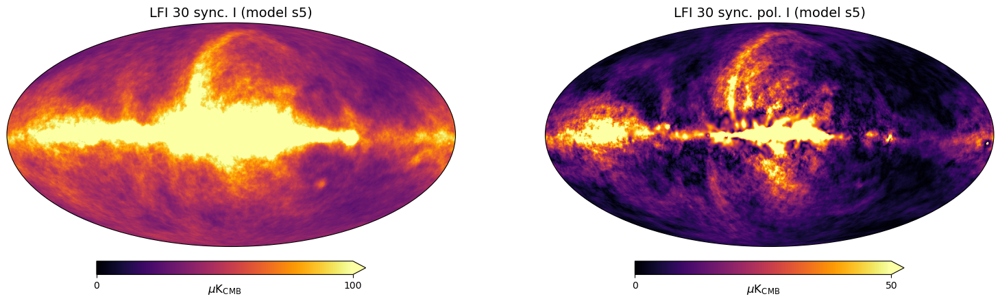

In [46]:
hp.projview(m=iqu_s5_30[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 sync. I (model s5)', graticule_color=None)
hp.projview(m=pol_s5_30, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 sync. pol. I (model s5)', graticule_color=None)

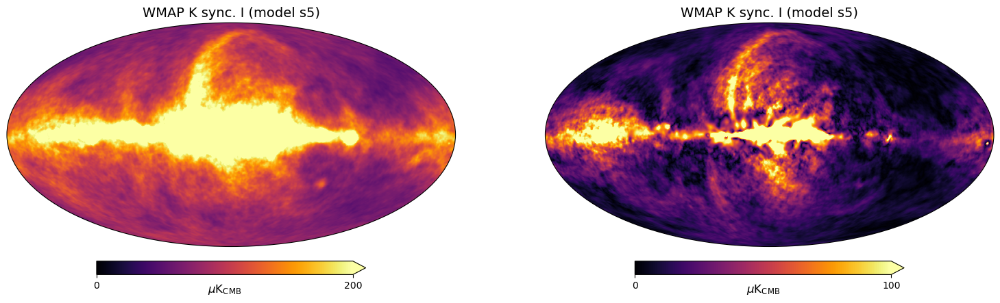

In [47]:
hp.projview(m=iqu_s5_k[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=200, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K sync. I (model s5)', graticule_color=None)
hp.projview(m=pol_s5_k, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K sync. I (model s5)', graticule_color=None)

In [48]:
DlEE_s5_30, DlBB_s5_30 = compute_Dl(iqu_s5_30)
DlEE_s5_x,  DlBB_s5_x  = compute_Dl(iqu_s5_30, iqu_2=iqu_s5_k)

In [49]:
alms = hp.map2alm(iqu_s5_30, lmax=lmax, use_weights=True, datapath=hpx_datapath)
iqu_s5_30_at512 = hp.alm2map(alms, nside_wmap)

In [50]:
DlEEnmt_s5_30, DlBBnmt_s5_30 = compute_nmtDl(iqu_s5_30)
DlEEnmt_s5_x,  DlBBnmt_s5_x  = compute_nmtDl(iqu_s5_30_at512, iqu_2=iqu_s5_k)

#### Synchrotron Model 7 (read and compute spectra)

In [51]:
iqu_s7_30 = hp.read_map('../data/sync7_v3.4b7_LFI030-bpi_' + str(nside) + '.fits', field=None, dtype=np.float64)
iqu_s7_k  = hp.read_map('../data/sync7_v3.4b7_WMAPK-bpi_' + str(nside_wmap) + '.fits', field=None, dtype=np.float64)

pol_s7_30 = np.sqrt(iqu_s7_30[1]**2. + iqu_s7_30[2]**2.)
pol_s7_k  = np.sqrt(iqu_s7_k[1]**2.  + iqu_s7_k[2]**2.)

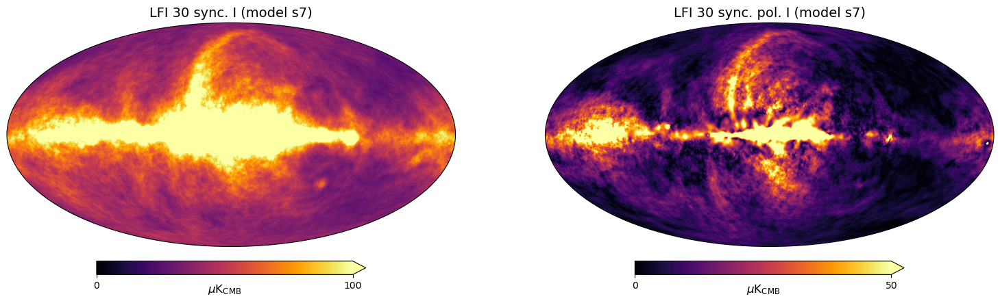

In [52]:
hp.projview(m=iqu_s7_30[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 sync. I (model s7)', graticule_color=None)
hp.projview(m=pol_s7_30, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 sync. pol. I (model s7)', graticule_color=None)

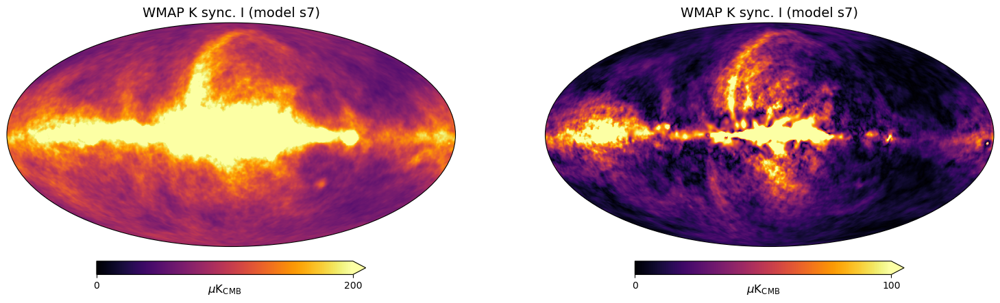

In [53]:
hp.projview(m=iqu_s7_k[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=200, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K sync. I (model s7)', graticule_color=None)
hp.projview(m=pol_s7_k, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K sync. I (model s7)', graticule_color=None)

In [54]:
DlEE_s7_30, DlBB_s7_30 = compute_Dl(iqu_s7_30)
DlEE_s7_x,  DlBB_s7_x  = compute_Dl(iqu_s7_30, iqu_2=iqu_s7_k)

In [55]:
alms = hp.map2alm(iqu_s7_30, lmax=lmax, use_weights=True, datapath=hpx_datapath)
iqu_s7_30_at512 = hp.alm2map(alms, nside_wmap)

In [56]:
DlEEnmt_s7_30, DlBBnmt_s7_30 = compute_nmtDl(iqu_s7_30)
DlEEnmt_s7_x,  DlBBnmt_s7_x  = compute_nmtDl(iqu_s7_30_at512, iqu_2=iqu_s7_k)

#### LFI 30 GHz/WMAP K polarized intensity in the SAT-TMA patch

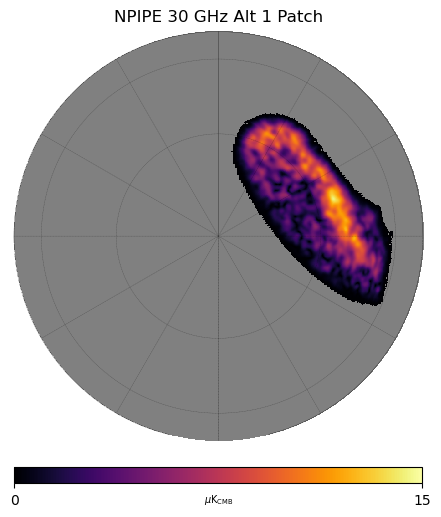

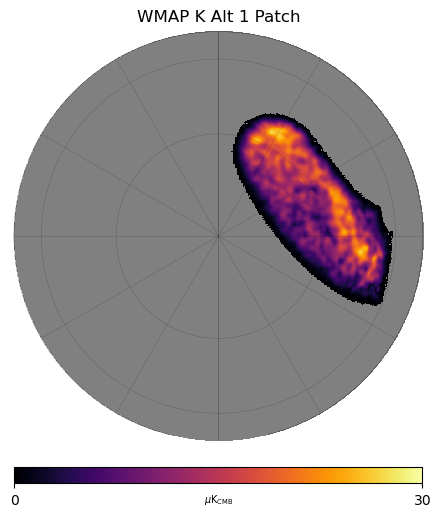

In [67]:
hp.orthview(np.ma.masked_array(pol_npipe30_smth*maskapo_1024, mask=1-mask_1024), unit=r'$\mu$K${}_{\rm CMB}$',xsize=900, min=0., max=15, cmap='inferno', title='NPIPE 30 GHz Alt 1 Patch', rot=(0, -90, 0), half_sky=True)
hp.graticule(c='k', lw=0.2)
hp.orthview(np.ma.masked_array(pol_wmapk_smth*maskapo_512,   mask=1-mask_512),   unit=r'$\mu$K${}_{\rm CMB}$',xsize=900, min=0., max=30, cmap='inferno', title='WMAP K Alt 1 Patch', rot=(0, -90, 0), half_sky=True)
hp.graticule(c='k', lw=0.2)

#### Compute smoothed synchrotron maps from models 

In [64]:
alms = hp.map2alm(iqu_s4_30, lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

print(np.any(np.isnan(Bl_com[:,1]/Bl_30[:,1])))

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_s4_30_smth = hp.alm2map(alms, nside)
pol_s4_30_smth = np.sqrt(iqu_s4_30_smth[1]**2. + iqu_s4_30_smth[2]**2.)

Es4_30_smth = hp.alm2map(alms[1], nside)
Bs4_30_smth = hp.alm2map(alms[2], nside)

False


In [65]:
alms = hp.map2alm(iqu_s5_30, lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

print(np.any(np.isnan(Bl_com[:,1]/Bl_30[:,1])))

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_s5_30_smth = hp.alm2map(alms, nside)
pol_s5_30_smth = np.sqrt(iqu_s5_30_smth[1]**2. + iqu_s5_30_smth[2]**2.)

Es5_30_smth = hp.alm2map(alms[1], nside)
Bs5_30_smth = hp.alm2map(alms[2], nside)

False


In [66]:
alms = hp.map2alm(iqu_s7_30, lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

print(np.any(np.isnan(Bl_com[:,1]/Bl_30[:,1])))

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_s7_30_smth = hp.alm2map(alms, nside)
pol_s7_30_smth = np.sqrt(iqu_s7_30_smth[1]**2. + iqu_s7_30_smth[2]**2.)

Es7_30_smth = hp.alm2map(alms[1], nside)
Bs7_30_smth = hp.alm2map(alms[2], nside)

False


#### Model polarized intensity in SAT-TMA patch

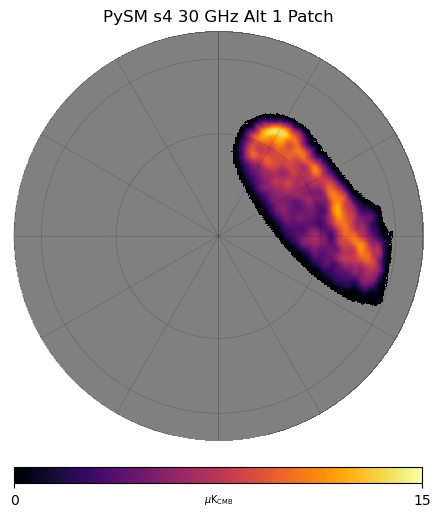

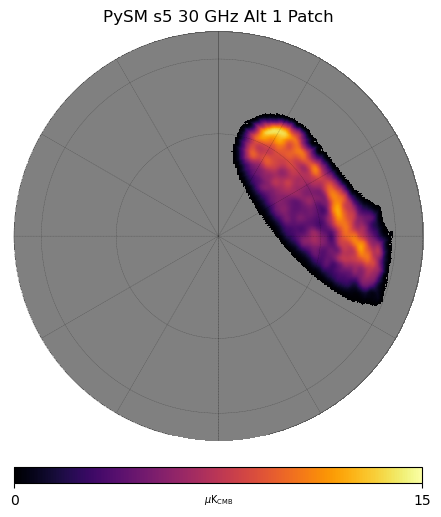

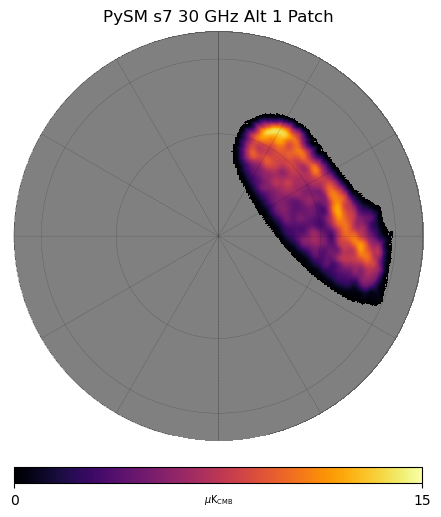

In [69]:
hp.orthview(np.ma.masked_array(pol_s4_30_smth*maskapo_1024, mask=1-mask_1024), unit=r'$\mu$K${}_{\rm CMB}$',xsize=900, min=0., max=15, cmap='inferno', title='PySM s4 30 GHz Alt 1 Patch', rot=(0, -90, 0), half_sky=True)
hp.graticule(c='k', lw=0.2)
hp.orthview(np.ma.masked_array(pol_s5_30_smth*maskapo_1024, mask=1-mask_1024), unit=r'$\mu$K${}_{\rm CMB}$',xsize=900, min=0., max=15, cmap='inferno', title='PySM s5 30 GHz Alt 1 Patch', rot=(0, -90, 0), half_sky=True)
hp.graticule(c='k', lw=0.2)
hp.orthview(np.ma.masked_array(pol_s7_30_smth*maskapo_1024, mask=1-mask_1024), unit=r'$\mu$K${}_{\rm CMB}$',xsize=900, min=0., max=15, cmap='inferno', title='PySM s7 30 GHz Alt 1 Patch', rot=(0, -90, 0), half_sky=True)
hp.graticule(c='k', lw=0.2)

#### Polarized intensity difference maps

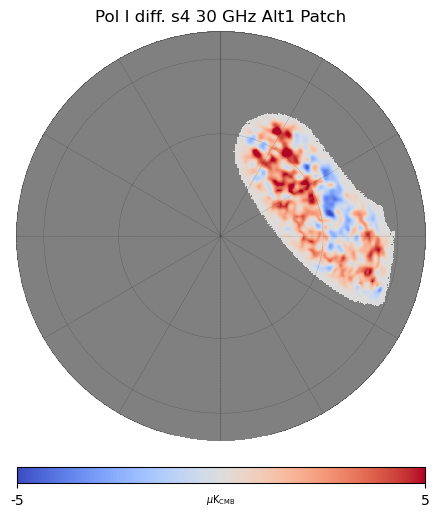

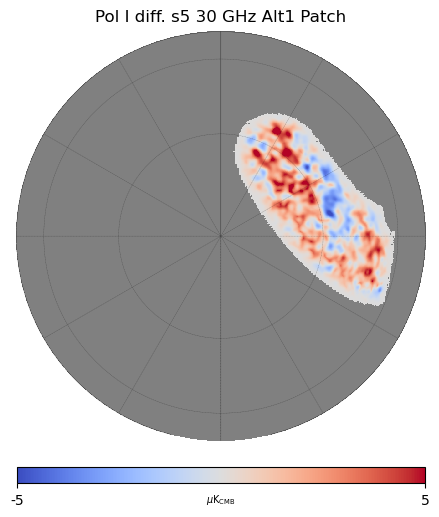

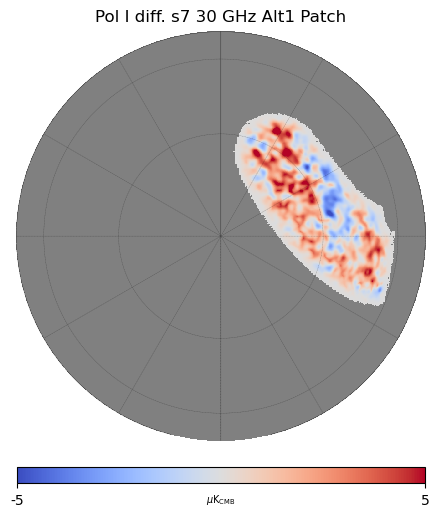

In [73]:
hp.orthview(np.ma.masked_array((pol_s4_30_smth - pol_npipe30_smth - pol_smica_smth)*maskapo_1024, mask=1-mask_1024), unit=r'$\mu$K${}_{\rm CMB}$',xsize=900, min=-5., max=5., cmap='coolwarm', title='Pol I diff. s4 30 GHz Alt1 Patch', rot=(0, -90, 0), half_sky=True)
hp.graticule(c='k', lw=0.2)
hp.orthview(np.ma.masked_array((pol_s5_30_smth - pol_npipe30_smth - pol_smica_smth)*maskapo_1024, mask=1-mask_1024), unit=r'$\mu$K${}_{\rm CMB}$',xsize=900, min=-5., max=5., cmap='coolwarm', title='Pol I diff. s5 30 GHz Alt1 Patch', rot=(0, -90, 0), half_sky=True)
hp.graticule(c='k', lw=0.2)
hp.orthview(np.ma.masked_array((pol_s7_30_smth - pol_npipe30_smth - pol_smica_smth)*maskapo_1024, mask=1-mask_1024), unit=r'$\mu$K${}_{\rm CMB}$',xsize=900, min=-5., max=5., cmap='coolwarm', title='Pol I diff. s7 30 GHz Alt1 Patch', rot=(0, -90, 0), half_sky=True)
hp.graticule(c='k', lw=0.2)

#### _E_ mode difference maps

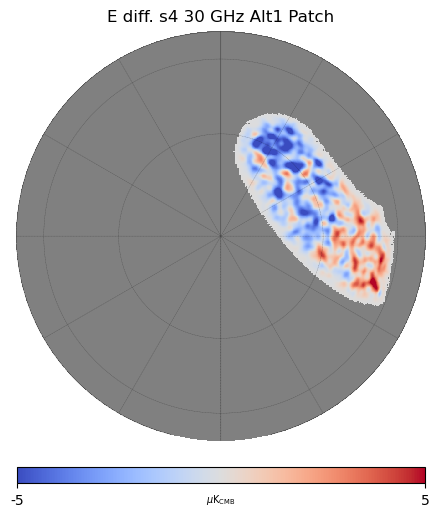

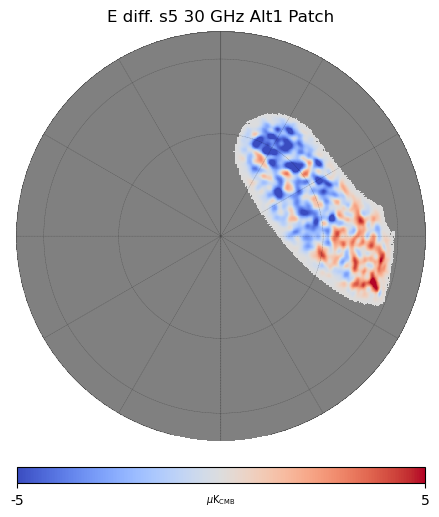

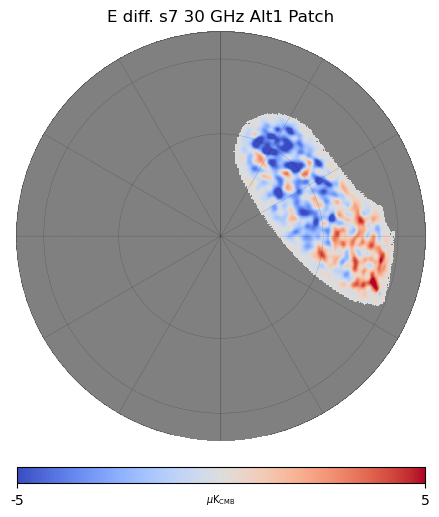

In [78]:
hp.orthview(np.ma.masked_array((Es4_30_smth - E_npipe30_smth - E_smica_smth)*maskapo_1024, mask=1-mask_1024), unit=r'$\mu$K${}_{\rm CMB}$',xsize=900, min=-5., max=5., cmap='coolwarm', title='E diff. s4 30 GHz Alt1 Patch', rot=(0, -90, 0), half_sky=True)
hp.graticule(c='k', lw=0.2)
hp.orthview(np.ma.masked_array((Es5_30_smth - E_npipe30_smth - E_smica_smth)*maskapo_1024, mask=1-mask_1024), unit=r'$\mu$K${}_{\rm CMB}$',xsize=900, min=-5., max=5., cmap='coolwarm', title='E diff. s5 30 GHz Alt1 Patch', rot=(0, -90, 0), half_sky=True)
hp.graticule(c='k', lw=0.2)
hp.orthview(np.ma.masked_array((Es7_30_smth - E_npipe30_smth - E_smica_smth)*maskapo_1024, mask=1-mask_1024), unit=r'$\mu$K${}_{\rm CMB}$',xsize=900, min=-5., max=5., cmap='coolwarm', title='E diff. s7 30 GHz Alt1 Patch', rot=(0, -90, 0), half_sky=True)
hp.graticule(c='k', lw=0.2)

#### _B_ mode difference maps

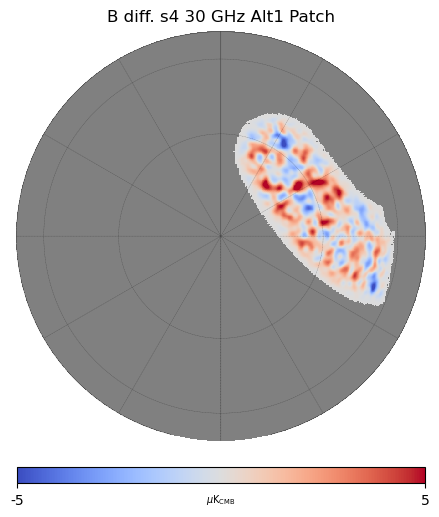

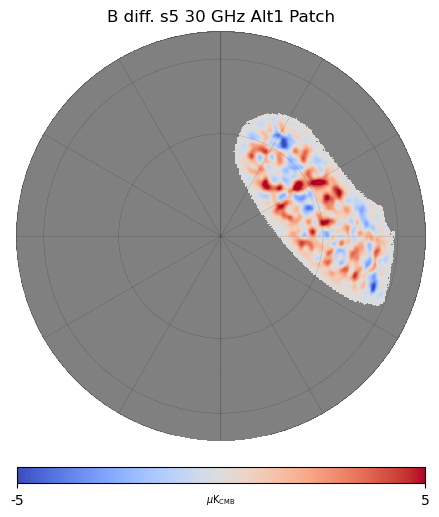

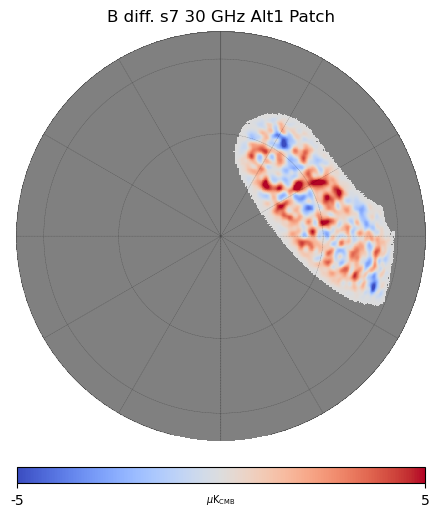

In [77]:
hp.orthview(np.ma.masked_array((Bs4_30_smth - B_npipe30_smth - B_smica_smth)*maskapo_1024, mask=1-mask_1024), unit=r'$\mu$K${}_{\rm CMB}$',xsize=900, min=-5., max=5., cmap='coolwarm', title='B diff. s4 30 GHz Alt1 Patch', rot=(0, -90, 0), half_sky=True)
hp.graticule(c='k', lw=0.2)
hp.orthview(np.ma.masked_array((Bs5_30_smth - B_npipe30_smth - B_smica_smth)*maskapo_1024, mask=1-mask_1024), unit=r'$\mu$K${}_{\rm CMB}$',xsize=900, min=-5., max=5., cmap='coolwarm', title='B diff. s5 30 GHz Alt1 Patch', rot=(0, -90, 0), half_sky=True)
hp.graticule(c='k', lw=0.2)
hp.orthview(np.ma.masked_array((Bs7_30_smth - B_npipe30_smth - B_smica_smth)*maskapo_1024, mask=1-mask_1024), unit=r'$\mu$K${}_{\rm CMB}$',xsize=900, min=-5., max=5., cmap='coolwarm', title='B diff. s7 30 GHz Alt1 Patch', rot=(0, -90, 0), half_sky=True)
hp.graticule(c='k', lw=0.2)

#### Scatter plots at NSIDE=64 in the SAT-TMA patch

Plots scatter of points $(d_i^{\rm model}, d_i^{\rm NPIPE})$ where $d_i$ is the map value (Pol Intensity/E/B) for $i$-th pixel for model/NPIPE. Should fall on a straight line with unit slope.

Text(0.5, 1.0, 'E map scatter')

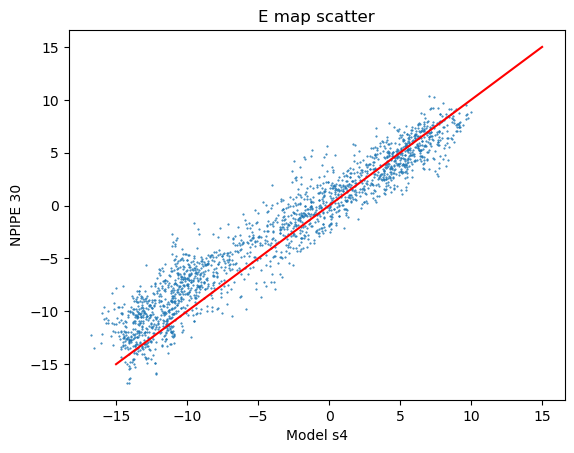

In [88]:
a = np.linspace(-15., 15., num=300)
mask_64 = hp.ud_grade(mask_512, 64)
Es4_64 = hp.ud_grade(Es4_30_smth, 64)
Enpipe_64 = hp.ud_grade(E_npipe30_smth, 64)
Esmica_64 = hp.ud_grade(E_smica_smth, 64)
plt.plot(Es4_64[mask_64 > 0.9], (Enpipe_64 - Esmica_64)[mask_64 > 0.9], 'o', ms=0.5)
plt.plot(a,a, 'r-')
plt.xlabel('Model s4')
plt.ylabel('NPIPE 30')
plt.title('E map scatter')


Text(0.5, 1.0, 'B map scatter')

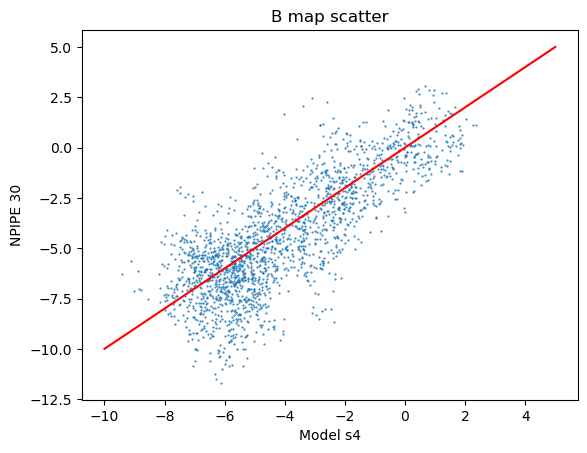

In [85]:
a = np.linspace(-10., 5., num=300)
mask_64 = hp.ud_grade(mask_512, 64)
Bs4_64 = hp.ud_grade(Bs4_30_smth, 64)
Bnpipe_64 = hp.ud_grade(B_npipe30_smth, 64)
plt.plot(Bs4_64[mask_64 > 0.9], Bnpipe_64[mask_64 > 0.9], 'o', ms=0.5)
plt.plot(a,a, 'r-')
plt.xlabel('Model s4')
plt.ylabel('NPIPE 30')
plt.title('B map scatter')

Text(0.5, 1.0, 'E map scatter')

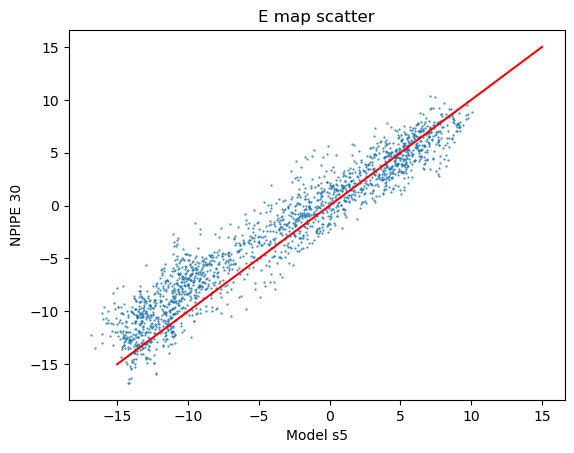

In [87]:
a = np.linspace(-15., 15., num=300)
mask_64 = hp.ud_grade(mask_512, 64)
Es5_64 = hp.ud_grade(Es5_30_smth, 64)
Enpipe_64 = hp.ud_grade(E_npipe30_smth, 64)
Esmica_64 = hp.ud_grade(E_smica_smth, 64)
plt.plot(Es5_64[mask_64 > 0.9], (Enpipe_64 - Esmica_64)[mask_64 > 0.9], 'o', ms=0.5)
plt.plot(a,a, 'r-')
plt.xlabel('Model s5')
plt.ylabel('NPIPE 30')
plt.title('E map scatter')

Text(0.5, 1.0, 'B map scatter')

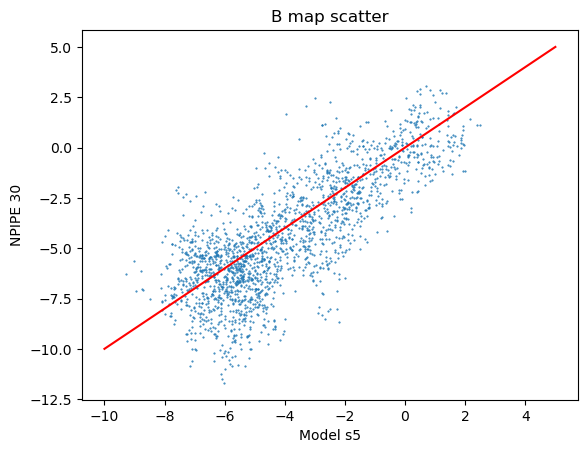

In [90]:
a = np.linspace(-10., 5., num=300)
mask_64 = hp.ud_grade(mask_512, 64)
Bs5_64 = hp.ud_grade(Bs5_30_smth, 64)
Bnpipe_64 = hp.ud_grade(B_npipe30_smth, 64)
plt.plot(Bs5_64[mask_64 > 0.9], Bnpipe_64[mask_64 > 0.9], 'o', ms=0.5)
plt.plot(a,a, 'r-')
plt.xlabel('Model s5')
plt.ylabel('NPIPE 30')
plt.title('B map scatter')

Text(0.5, 1.0, 'E map scatter')

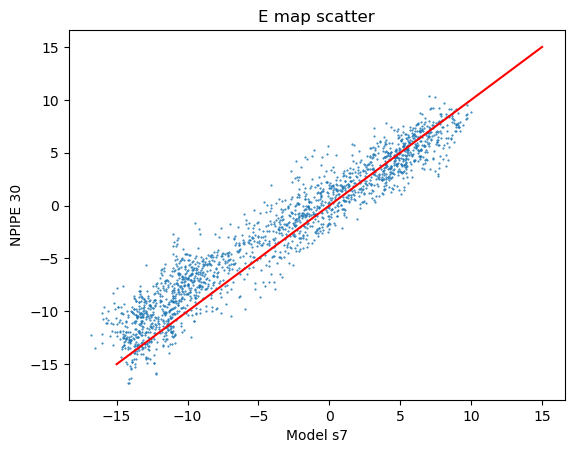

In [91]:
a = np.linspace(-15., 15., num=300)
mask_64 = hp.ud_grade(mask_512, 64)
Es7_64 = hp.ud_grade(Es7_30_smth, 64)
Enpipe_64 = hp.ud_grade(E_npipe30_smth, 64)
Esmica_64 = hp.ud_grade(E_smica_smth, 64)
plt.plot(Es7_64[mask_64 > 0.9], (Enpipe_64 - Esmica_64)[mask_64 > 0.9], 'o', ms=0.5)
plt.plot(a,a, 'r-')
plt.xlabel('Model s7')
plt.ylabel('NPIPE 30')
plt.title('E map scatter')

Text(0.5, 1.0, 'B map scatter')

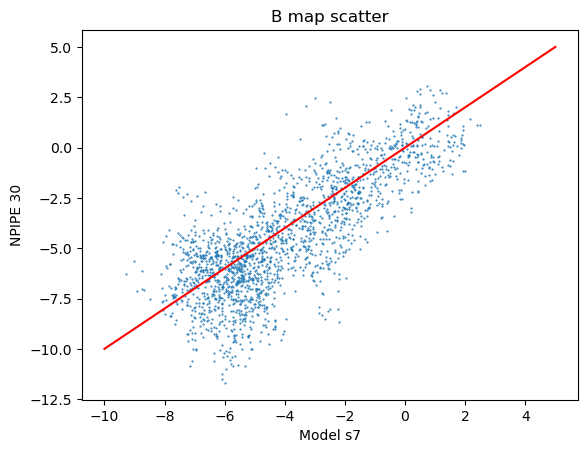

In [92]:
a = np.linspace(-10., 5., num=300)
mask_64 = hp.ud_grade(mask_512, 64)
Bs7_64 = hp.ud_grade(Bs7_30_smth, 64)
Bnpipe_64 = hp.ud_grade(B_npipe30_smth, 64)
plt.plot(Bs7_64[mask_64 > 0.9], Bnpipe_64[mask_64 > 0.9], 'o', ms=0.5)
plt.plot(a,a, 'r-')
plt.xlabel('Model s7')
plt.ylabel('NPIPE 30')
plt.title('B map scatter')

#### Power spectra plots

In [93]:
ellmax = 1024
ells = np.arange(0, ellmax+1)
Dell_factor = ells * (ells + 1.) / 2. / np.pi

##### Bicep-Keck upper limit on synchrotron amplitude from BK2021 joint analysis with Planck and WMAP 

In [99]:
As_BK_at23 = 1.4 # in uK^2 from BK 2021 joint analysis with Planck and WMAP at 23 GHz at ell of 80
As_BK_at30 = As_BK_at23 * (30/23)**(-3.1)    # Converts As from reference freq at 23 to 30 GHz assuming beta_s = -3.1

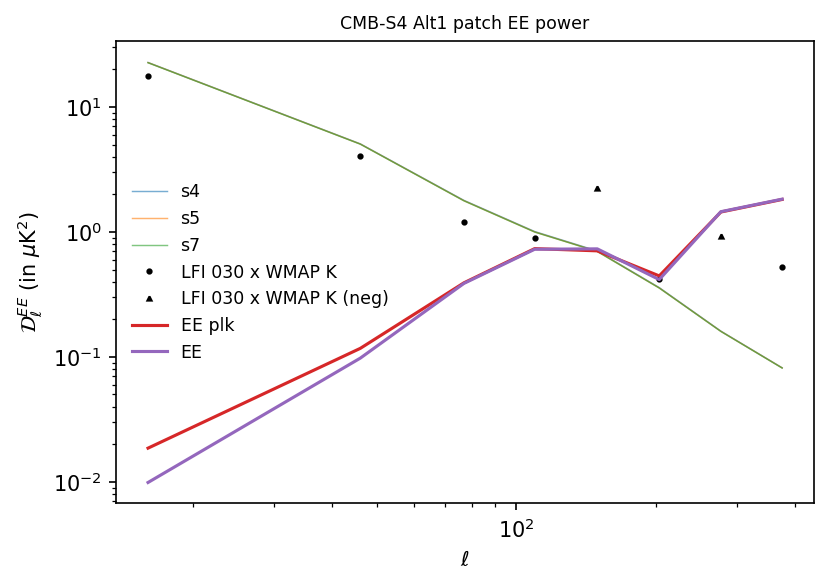

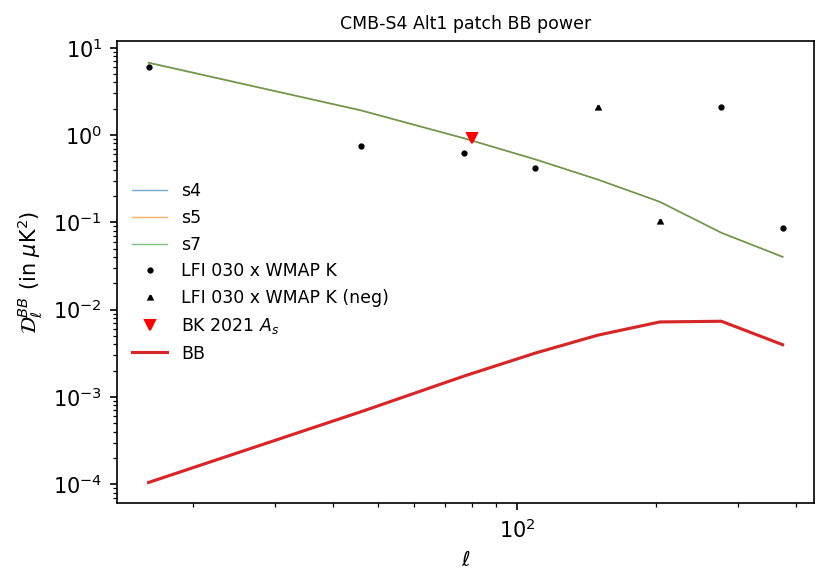

In [100]:
fig_new, ax = plt.subplots(num=1, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(DlEE_s4_x[:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(DlEE_s5_x[:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(DlEE_s7_x[:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner(DlEE_npxk[:501]),  'ko', ms=2.,label='LFI 030 x WMAP K')
ax.plot(leff, -binner(DlEE_npxk[:501]), 'k^', ms=2., label='LFI 030 x WMAP K (neg)')
ax.plot(leff, binner((plkEE)[:501]*Bl[:501,1]**2./calPLK**2.), '-', ms=2.,label='EE plk')
ax.plot(leff, binner(Dell_factor[:501]*EE[:501]), '-', ms=2.,label='EE')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{EE}$ (in $\mu{\rm K}^2$)')
ax.set_title('CMB-S4 Alt1 patch EE power', fontsize='small')
plt.savefig('../output/DlEE_PySM3-4b7_vs_LFI30xWMAPK_BPI_CMB-S4.jpg', bbox_inches='tight', pad_inches=0.1)

fig_new, ax = plt.subplots(num=2, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(DlBB_s4_x[0:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(DlBB_s5_x[0:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(DlBB_s7_x[0:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner(DlBB_npxk[0:501]), 'ko', ms=2.,label='LFI 030 x WMAP K')
ax.plot(leff, -binner(DlBB_npxk[:501]), 'k^', ms=2., label='LFI 030 x WMAP K (neg)')
ax.plot(80, np.sqrt(As_BK_at30*As_BK_at23), 'rv', ms=5.,label=r'BK 2021 $A_s$')
ax.plot(leff, binner(Dell_factor[0:501]*BB[0:501]), '-', ms=2.,label='BB')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{BB}$ (in $\mu{\rm K}^2$)')
ax.set_title('CMB-S4 Alt1 patch BB power', fontsize='small')
plt.savefig('../output/DlBB_PySM3-4b7_vs_LFI30xWMAPK_BPI_CMB-S4.jpg', bbox_inches='tight', pad_inches=0.1)

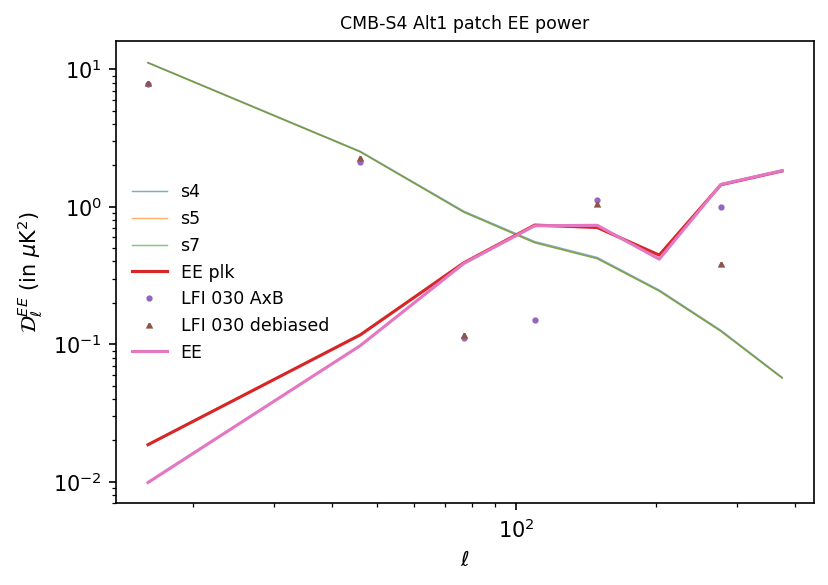

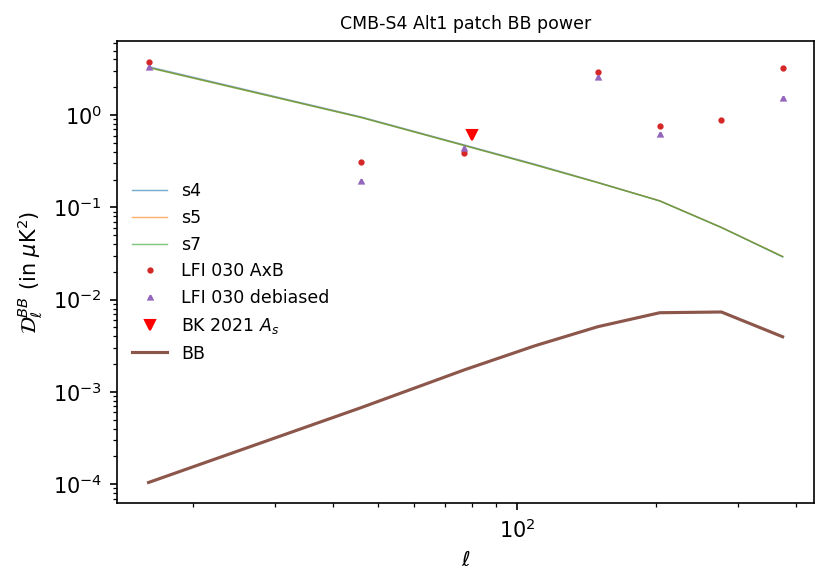

In [101]:
fig_new, ax = plt.subplots(num=1, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(DlEE_s4_30[:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(DlEE_s5_30[:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(DlEE_s7_30[:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner((plkEE)[:501]*Bl[:501,1]**2./calPLK**2.), '-', ms=2.,label='EE plk')
ax.plot(leff, binner(  DlEE_AxB[:501]), 'o', ms=2.,label='LFI 030 AxB')
ax.plot(leff, binner(DlEE_npipe[:501] - DlEE_hd[:501]), '^', ms=2.,label='LFI 030 debiased')
ax.plot(leff, binner(  Dell_factor[:501]*EE[:501]), '-', ms=2.,label='EE')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{EE}$ (in $\mu{\rm K}^2$)')
ax.set_title('CMB-S4 Alt1 patch EE power', fontsize='small')
plt.savefig('../output/DlEE_PySM3-4b7_vs_LFI30_BPI_CMB-S4.jpg', bbox_inches='tight', pad_inches=0.1)

fig_new, ax = plt.subplots(num=2, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(DlBB_s4_30[:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(DlBB_s5_30[:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(DlBB_s7_30[:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner(  DlBB_AxB[:501]), 'o', ms=2.,label='LFI 030 AxB')
ax.plot(leff, binner(DlBB_npipe[:501] - DlBB_hd[:501]), '^', ms=2.,label='LFI 030 debiased')
ax.plot(80, As_BK_at30, 'rv', ms=5.,label=r'BK 2021 $A_s$')
ax.plot(leff, binner(  Dell_factor[:501]*BB[:501]), '-', ms=2.,label='BB')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{BB}$ (in $\mu{\rm K}^2$)')
ax.set_title('CMB-S4 Alt1 patch BB power', fontsize='small')
plt.savefig('../output/DlBB_PySM3-4b7_vs_LFI30_BPI_CMB-S4.jpg', bbox_inches='tight', pad_inches=0.1)

#### NaMaster Power Spectra plots

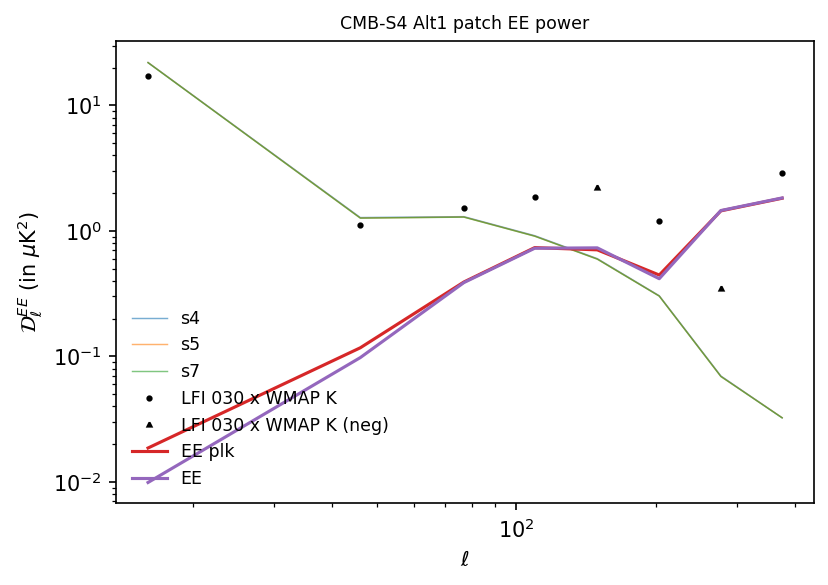

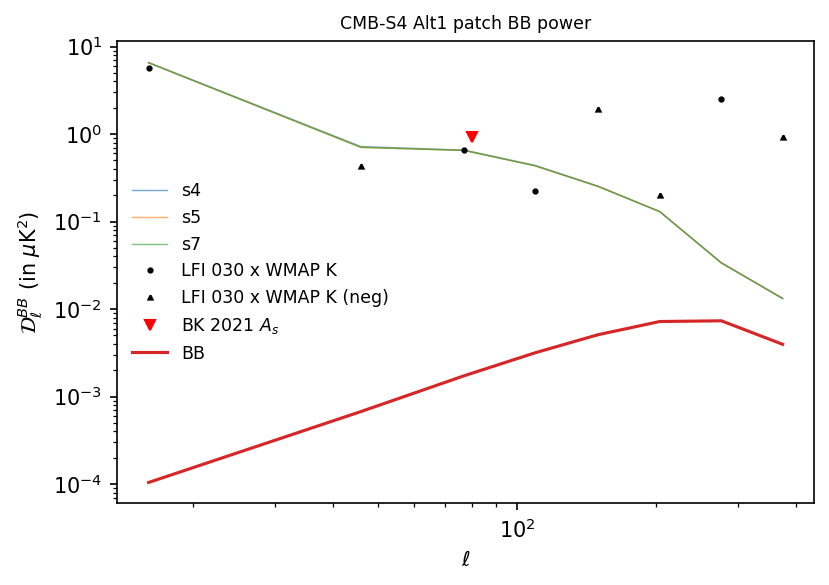

In [102]:
fig_new, ax = plt.subplots(num=1, figsize=(6, 4), dpi=150)
ax.plot(leff, DlEEnmt_s4_x, '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, DlEEnmt_s5_x, '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, DlEEnmt_s7_x, '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, DlEEnmt_npxk,  'ko', ms=2.,label='LFI 030 x WMAP K')
ax.plot(leff, -DlEEnmt_npxk, 'k^', ms=2., label='LFI 030 x WMAP K (neg)')
ax.plot(leff, binner(plkEE[:lmax_o+1]*Bl[:lmax_o+1,1]**2./calPLK**2.), '-', ms=2.,label='EE plk')
ax.plot(leff, binner(Dell_factor[:lmax_o+1]*EE[:lmax_o+1]), '-', ms=2.,label='EE')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{EE}$ (in $\mu{\rm K}^2$)')
ax.set_title('CMB-S4 Alt1 patch EE power', fontsize='small')
plt.savefig('../output/DlEEnmt_PySM3-4b7_vs_LFI30xWMAPK_BPI_CMB-S4.jpg', bbox_inches='tight', pad_inches=0.1)

fig_new, ax = plt.subplots(num=2, figsize=(6, 4), dpi=150)
ax.plot(leff, DlBBnmt_s4_x, '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, DlBBnmt_s5_x, '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, DlBBnmt_s7_x, '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, DlBBnmt_npxk, 'ko', ms=2.,label='LFI 030 x WMAP K')
ax.plot(leff, -DlBBnmt_npxk, 'k^', ms=2., label='LFI 030 x WMAP K (neg)')
ax.plot(80, np.sqrt(As_BK_at30*As_BK_at23), 'rv', ms=5.,label=r'BK 2021 $A_s$')
ax.plot(leff, binner(Dell_factor[0:lmax_o+1]*BB[0:lmax_o+1]), '-', ms=2.,label='BB')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{BB}$ (in $\mu{\rm K}^2$)')
ax.set_title('CMB-S4 Alt1 patch BB power', fontsize='small')
plt.savefig('../output/DlBBnmt_PySM3-4b7_vs_LFI30xWMAPK_BPI_CMB-S4.jpg', bbox_inches='tight', pad_inches=0.1)